--- Inspecting REAL Samples ---


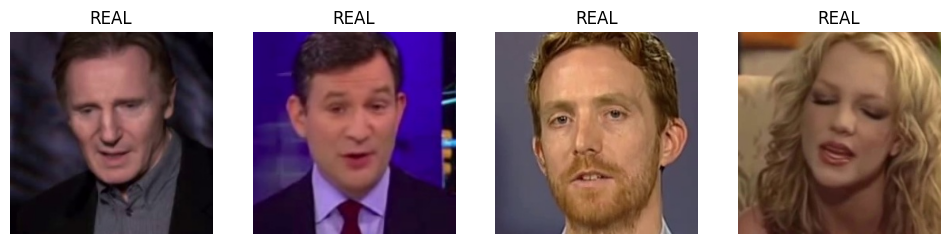

--- Inspecting FAKE Samples ---


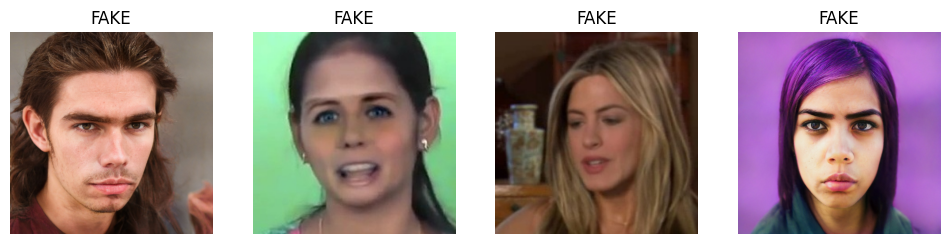

In [2]:
import os, cv2, random
import matplotlib.pyplot as plt

fake_path = "/kaggle/input/datasets/eso1844/final-model/fake"
real_path = "/kaggle/input/datasets/eso1844/final-model/real"

def plot_samples(path, title, n=4):
    imgs = random.sample(os.listdir(path), n)
    plt.figure(figsize=(12, 4))
    for i, name in enumerate(imgs, 1):
        img_path = os.path.join(path, name)
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n, i)
        plt.imshow(img)
        plt.title(f"{title}")
        plt.axis('off')
    plt.show()

for p, t in [(real_path, "REAL"), (fake_path, "FAKE")]:
    print(f"--- Inspecting {t} Samples ---")
    plot_samples(p, t)

In [3]:
import os

real_path = "/kaggle/input/datasets/eso1844/final-model/real"
fake_path = "/kaggle/input/datasets/eso1844/final-model/fake"

print("REAL samples:", len(os.listdir(real_path)))
print("FAKE samples:", len(os.listdir(fake_path)))

REAL samples: 9516
FAKE samples: 9526


In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
from tqdm.notebook import tqdm
from pathlib import Path

INPUT_ROOT  = Path("/kaggle/input/datasets/eso1844/final-model")
OUTPUT_ROOT = Path("/kaggle/working/preprocessed_224")
CATEGORIES  = ["real", "fake"]
TARGET_SIZE = 224

def apply_resize_and_padding(img, target_size=224):
    h, w = img.shape[:2]
    mean_color = img.mean(axis=(0, 1)).astype(np.uint8)
    scale = target_size / max(h, w)
    nh, nw = int(h * scale), int(w * scale)
    resized_img = cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)
    canvas = np.full((target_size, target_size, 3), mean_color, dtype=np.uint8)
    y, x = (target_size - nh)//2, (target_size - nw)//2
    canvas[y:y+nh, x:x+nw] = resized_img
    return canvas

def run_process():
    print(" Checking input paths...")
    if not INPUT_ROOT.exists():
        print(f" FAILED: The path {INPUT_ROOT} does not exist.")
        print("Existing folders in /kaggle/input are:")
        print(os.listdir("/kaggle/input/"))
        return
    for cat in CATEGORIES:
        in_dir = INPUT_ROOT / cat
        out_dir = OUTPUT_ROOT / cat
        out_dir.mkdir(parents=True, exist_ok=True)
        files = [f for f in os.listdir(in_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not files:
            print(f" Warning: No images found in {in_dir}")
            continue
        print(f" Found {len(files)} images in '{cat}'. Starting processing...")
        for f in tqdm(files, desc=f"Processing {cat}"):
            img_path = in_dir / f
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None: continue
            processed_bgr = apply_resize_and_padding(img_bgr, TARGET_SIZE)
            img_rgb = cv2.cvtColor(processed_bgr, cv2.COLOR_BGR2RGB)
            Image.fromarray(img_rgb).save(out_dir / f, quality=95)

run_process()

🔍 Checking input paths...
✅ Found 9516 images in 'real'. Starting processing...


Processing real:   0%|          | 0/9516 [00:00<?, ?it/s]

✅ Found 9526 images in 'fake'. Starting processing...


Processing fake:   0%|          | 0/9526 [00:00<?, ?it/s]

🧐 Inspecting processed images in: /kaggle/working/preprocessed_224


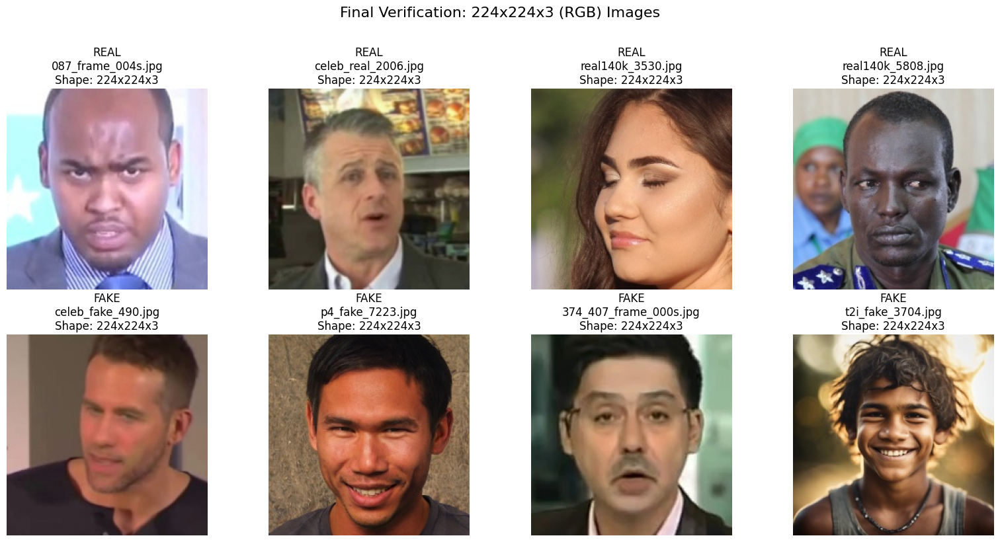

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

PROCESSED_ROOT = Path("/kaggle/working/preprocessed_224")
CATEGORIES = ["real", "fake"]

def visualize_processed_data(samples_per_cat=4):
    fig, axes = plt.subplots(len(CATEGORIES), samples_per_cat, figsize=(16, 8))
    print(f" Inspecting processed images in: {PROCESSED_ROOT}")
    for i, cat in enumerate(CATEGORIES):
        cat_dir = PROCESSED_ROOT / cat
        if not cat_dir.exists():
            print(f"❌ Folder not found: {cat_dir}")
            continue
        all_files = [f for f in os.listdir(cat_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not all_files:
            print(f" No images found in {cat_dir}")
            continue
        samples = random.sample(all_files, min(samples_per_cat, len(all_files)))
        for j, f in enumerate(samples):
            img_path = cat_dir / f
            img = Image.open(img_path)
            img_array = np.array(img)
            h, w, c = img_array.shape
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"{cat.upper()}\n{f}\nShape: {h}x{w}x{c}")
            axes[i, j].axis("off")
    plt.suptitle("Final Verification: 224x224x3 (RGB) Images", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

visualize_processed_data(samples_per_cat=4)

In [6]:
pip install MTCNN

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 23.9 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 58.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [7]:
!pip install lz4

In [ ]:
import os
import cv2
import numpy as np
import shutil
from PIL import Image
from mtcnn import MTCNN
from tqdm.notebook import tqdm
from pathlib import Path

INPUT_BASE  = Path('/kaggle/working/preprocessed_224')
OUTPUT_BASE = Path('/kaggle/working/aligned_faces')
CATEGORIES = ["real", "fake"]

if OUTPUT_BASE.exists():
    print(f"🧹 Clearing old data in {OUTPUT_BASE} to prevent duplication...")
    shutil.rmtree(OUTPUT_BASE)

for cat in CATEGORIES:
    (OUTPUT_BASE / cat).mkdir(parents=True, exist_ok=True)

detector = MTCNN()

def align_face(img_rgb):
    results = detector.detect_faces(img_rgb)
    if not results:
        return None
    results = sorted(results, key=lambda x: x['box'][2] * x['box'][3], reverse=True)
    kp = results[0]['keypoints']
    le, re = kp['left_eye'], kp['right_eye']
    angle = np.degrees(np.arctan2(float(re[1]-le[1]), float(re[0]-le[0])))
    dist  = np.sqrt((re[0]-le[0])**2 + (re[1]-le[1])**2)
    scale = (224 * 0.3) / (dist if dist > 0 else 1)
    center = ((le[0] + re[0]) / 2.0, (le[1] + re[1]) / 2.0)
    M = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(img_rgb, M, (224, 224), flags=cv2.INTER_CUBIC)

def run_alignment():
    total_processed = 0
    for label in CATEGORIES:
        in_folder = INPUT_BASE / label
        out_folder = OUTPUT_BASE / label
        if not in_folder.exists():
            print(f"❌ Input folder missing: {in_folder}")
            continue
        files = [f for f in os.listdir(in_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        print(f" Processing {len(files)} unique images for category: {label}")
        ok, skip = 0, 0
        for fname in tqdm(files, desc=f"Aligning {label}"):
            img_path = in_folder / fname
            img = cv2.imread(str(img_path))
            if img is None:
                skip += 1
                continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            aligned = align_face(img_rgb)
            if aligned is None:
                skip += 1
                continue
            save_path = out_folder / fname
            Image.fromarray(aligned).save(save_path, 'JPEG', quality=98)
            ok += 1
        print(f"✅ {label.upper()} Result: {ok} aligned, {skip} skipped (No face detected).")
        total_processed += ok
    print(f"\n✨ FINAL TOTAL: {total_processed} aligned images saved to {OUTPUT_BASE}")

run_alignment()

2026-05-05 17:28:29.916828: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778002109.938799     253 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778002109.946007     253 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778002109.963717     253 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778002109.963739     253 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778002109.963741     253 computation_placer.cc:177] computation placer alr

🧹 Clearing old data in /kaggle/working/aligned_faces to prevent duplication...


I0000 00:00:1778002115.779796     253 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1778002115.785016     253 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


🚀 Processing 9516 unique images for category: real


Aligning real:   0%|          | 0/9516 [00:00<?, ?it/s]

✅ REAL Result: 9501 aligned, 15 skipped (No face detected).
🚀 Processing 9526 unique images for category: fake


Aligning fake:   0%|          | 0/9526 [00:00<?, ?it/s]

✅ FAKE Result: 9474 aligned, 52 skipped (No face detected).

✨ FINAL TOTAL: 18975 aligned images saved to /kaggle/working/aligned_faces


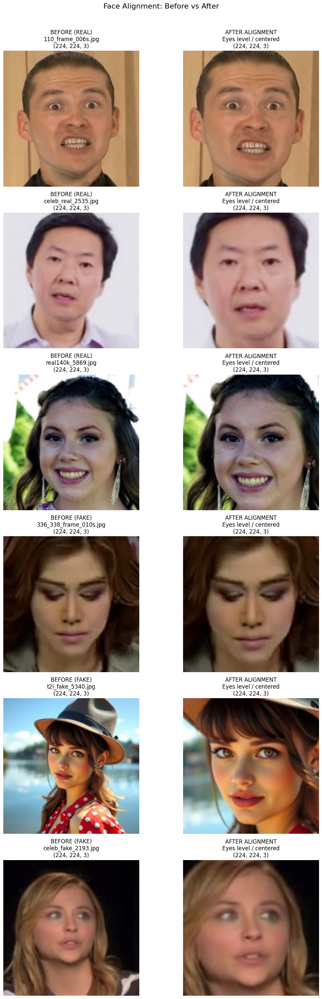

In [2]:
import os, random, numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

BEFORE_ALIGN = Path('/kaggle/working/preprocessed_224')
AFTER_ALIGN  = Path('/kaggle/working/aligned_faces')
CATEGORIES   = ['real', 'fake']

def visualize_alignment(samples_per_cat=3):
    total_rows = len(CATEGORIES) * samples_per_cat
    fig, axes  = plt.subplots(total_rows, 2, figsize=(12, 5 * total_rows))
    row_idx    = 0
    for cat in CATEGORIES:
        aligned_dir = AFTER_ALIGN / cat
        files = [f for f in os.listdir(aligned_dir)
                 if f.lower().endswith(('.jpg','.jpeg','.png'))]
        samples = random.sample(files, min(samples_per_cat, len(files)))
        for fname in samples:
            before = Image.open(BEFORE_ALIGN / cat / fname)
            after  = Image.open(AFTER_ALIGN  / cat / fname)
            axes[row_idx, 0].imshow(before)
            axes[row_idx, 0].set_title(
                f'BEFORE ({cat.upper()})\n{fname}\n{np.array(before).shape}')
            axes[row_idx, 0].axis('off')
            axes[row_idx, 1].imshow(after)
            axes[row_idx, 1].set_title(
                f'AFTER ALIGNMENT\nEyes level / centered\n{np.array(after).shape}')
            axes[row_idx, 1].axis('off')
            row_idx += 1
    plt.suptitle('Face Alignment: Before vs After', fontsize=16, y=1.01)
    plt.tight_layout()
    plt.show()

visualize_alignment(samples_per_cat=3)

In [ ]:
import os, cv2, numpy as np
from PIL import Image
from tqdm import tqdm
import shutil

INPUT_BASE  = '/kaggle/working/aligned_faces'
OUTPUT_BASE = '/kaggle/working/dct_features'

# Clean start
if os.path.exists(OUTPUT_BASE):
    shutil.rmtree(OUTPUT_BASE)
os.makedirs(f'{OUTPUT_BASE}/real', exist_ok=True)
os.makedirs(f'{OUTPUT_BASE}/fake', exist_ok=True)

def extract_dct(img_rgb):
    y_channel  = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YUV)[:, :, 0]
    dct_coeffs = cv2.dct(np.float32(y_channel) / 255.0)
    dct_log    = np.log(np.abs(dct_coeffs) + 1e-12)
    return cv2.normalize(dct_log, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def process(label):
    files = [f for f in os.listdir(f'{INPUT_BASE}/{label}')
             if f.lower().endswith(('.jpg','.jpeg','.png'))]
    ok, skip = 0, 0
    for fname in tqdm(files, desc=label):
        try:
            img = np.array(Image.open(
                f'{INPUT_BASE}/{label}/{fname}').convert('RGB'))
            if img is None or img.size == 0:
                skip += 1
                continue
            dct_map = extract_dct(img)
            
            cv2.imwrite(
                f'{OUTPUT_BASE}/{label}/{os.path.splitext(fname)[0]}.png',
                dct_map,
                [cv2.IMWRITE_PNG_COMPRESSION, 0])
            ok += 1
        except Exception:
            skip += 1
    print(f'{label}: extracted={ok}  skipped={skip}')
    return ok

ok_r = process('real')
ok_f = process('fake')

print(f'\n{"="*40}')
print(f'real={ok_r}  fake={ok_f}  total={ok_r+ok_f}')
print(f'(Count depends on how many faces MTCNN detected in your dataset)')
print(f'{"="*40}')

real: 100%|██████████| 9501/9501 [00:23<00:00, 412.12it/s]


real: extracted=9501  skipped=0


fake: 100%|██████████| 9474/9474 [00:23<00:00, 405.51it/s]

fake: extracted=9474  skipped=0

real=9501  fake=9474  total=18975
(Count depends on how many faces MTCNN detected in your dataset)


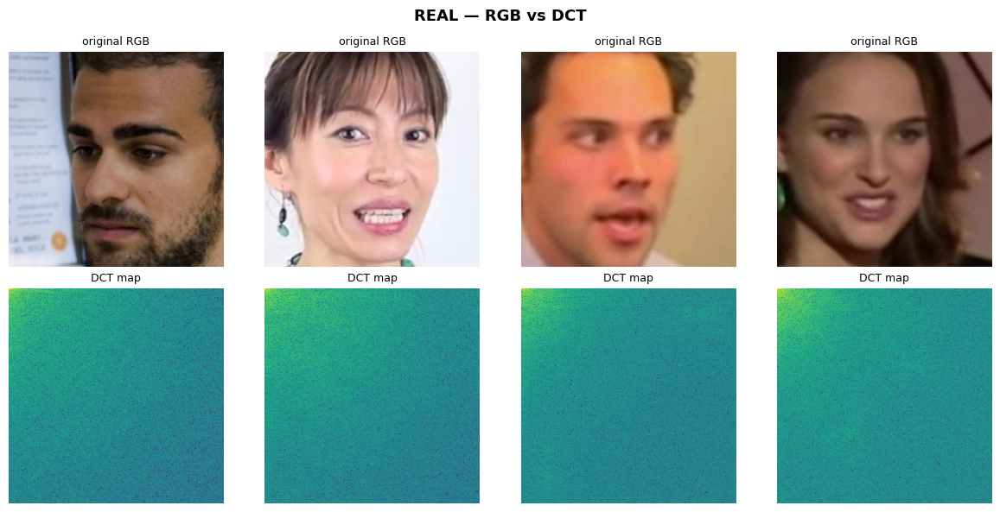

real — matched pairs: 9501


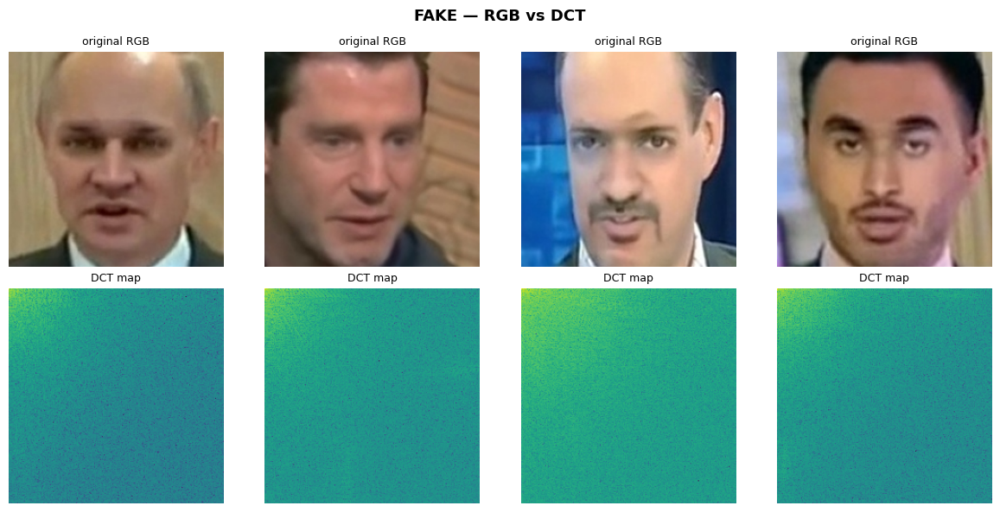

fake — matched pairs: 9474


In [4]:
import os, random, numpy as np
import matplotlib.pyplot as plt
from PIL import Image

RGB_BASE = '/kaggle/working/aligned_faces'
DCT_BASE = '/kaggle/working/dct_features'

def show_dct_samples(label, n=4):
    rgb_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{RGB_BASE}/{label}')
                 if f.lower().endswith(('.jpg','.jpeg','.png'))}
    dct_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{DCT_BASE}/{label}')
                 if f.lower().endswith('.png')}
    common = list(set(rgb_files.keys()) & set(dct_files.keys()))
    if not common:
        print(f'No matching pairs for {label}')
        return
    samples = random.sample(common, min(n, len(common)))
    fig, axes = plt.subplots(2, n, figsize=(3*n, 6))
    fig.suptitle(f'{label.upper()} — RGB vs DCT',
                 fontsize=13, fontweight='bold')
    for i, base in enumerate(samples):
        rgb = Image.open(f'{RGB_BASE}/{label}/{rgb_files[base]}').convert('RGB')
        dct = Image.open(f'{DCT_BASE}/{label}/{dct_files[base]}')
        axes[0, i].imshow(rgb)
        axes[0, i].set_title('original RGB', fontsize=9)
        axes[0, i].axis('off')
        axes[1, i].imshow(dct, cmap='viridis')
        axes[1, i].set_title('DCT map', fontsize=9)
        axes[1, i].axis('off')
    plt.tight_layout()
    plt.show()
    print(f'{label} — matched pairs: {len(common)}')

show_dct_samples('real')
show_dct_samples('fake')

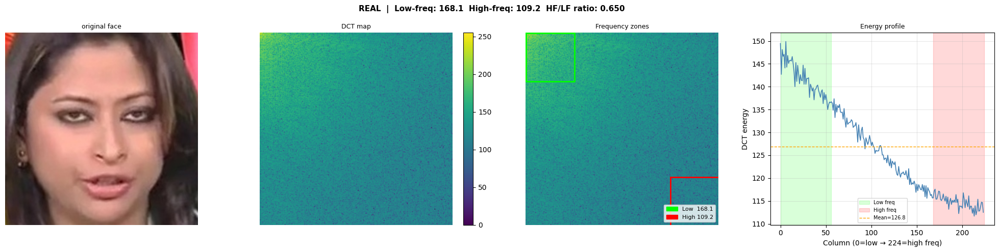

─────────────────────────────────────────────
  Low  freq energy : 168.08
  High freq energy : 109.21
  HF/LF ratio      : 0.6498
  → LOW ratio: typical natural face
─────────────────────────────────────────────


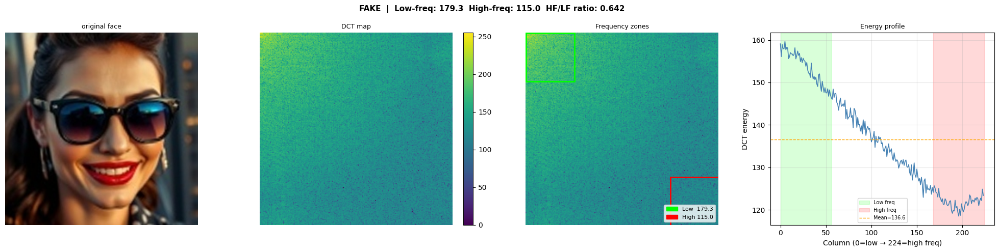

─────────────────────────────────────────────
  Low  freq energy : 179.30
  High freq energy : 115.05
  HF/LF ratio      : 0.6417
  → LOW ratio: typical natural face
─────────────────────────────────────────────


In [5]:
import os, random, numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
import cv2

DCT_BASE    = '/kaggle/working/dct_features'
MASKED_BASE = '/kaggle/working/aligned_faces'

def explain_dct_map(label='fake'):
    rgb_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{MASKED_BASE}/{label}')
                 if f.lower().endswith(('.jpg','.jpeg','.png'))}
    dct_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{DCT_BASE}/{label}')
                 if f.lower().endswith('.png')}
    common = list(set(rgb_files.keys()) & set(dct_files.keys()))
    base   = random.choice(common)
    rgb = np.array(Image.open(
            f'{MASKED_BASE}/{label}/{rgb_files[base]}').convert('RGB'))
    dct = cv2.imread(f'{DCT_BASE}/{label}/{dct_files[base]}',
                     cv2.IMREAD_GRAYSCALE)
    energy_tl = dct[:56,  :56 ].mean()
    energy_br = dct[168:, 168:].mean()
    ratio     = energy_br / (energy_tl + 1e-6)
    mean_val  = dct.mean()
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(
        f'{label.upper()}  |  Low-freq: {energy_tl:.1f}  '
        f'High-freq: {energy_br:.1f}  HF/LF ratio: {ratio:.3f}',
        fontsize=11, fontweight='bold')
    axes[0].imshow(rgb)
    axes[0].set_title('original face', fontsize=9)
    axes[0].axis('off')
    im = axes[1].imshow(dct, cmap='viridis')
    axes[1].set_title('DCT map', fontsize=9)
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1], fraction=0.046)
    axes[2].imshow(dct, cmap='viridis')
    axes[2].add_patch(plt.Rectangle((0,0),    56, 56,
                      edgecolor='lime', facecolor='none', lw=2))
    axes[2].add_patch(plt.Rectangle((168,168),56, 56,
                      edgecolor='red',  facecolor='none', lw=2))
    axes[2].set_title('Frequency zones', fontsize=9)
    axes[2].axis('off')
    axes[2].legend(handles=[
        mpatches.Patch(color='lime', label=f'Low  {energy_tl:.1f}'),
        mpatches.Patch(color='red',  label=f'High {energy_br:.1f}')],
        loc='lower right', fontsize=8)
    profile = dct.mean(axis=0)
    axes[3].plot(profile, color='steelblue', linewidth=1.2)
    axes[3].axvspan(0,   56,  alpha=0.15, color='lime', label='Low freq')
    axes[3].axvspan(168, 224, alpha=0.15, color='red',  label='High freq')
    axes[3].axhline(mean_val, color='orange', linestyle='--',
                    linewidth=1, label=f'Mean={mean_val:.1f}')
    axes[3].set_title('Energy profile', fontsize=9)
    axes[3].set_xlabel('Column (0=low → 224=high freq)')
    axes[3].set_ylabel('DCT energy')
    axes[3].legend(fontsize=7)
    axes[3].grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f'{"─"*45}')
    print(f'  Low  freq energy : {energy_tl:.2f}')
    print(f'  High freq energy : {energy_br:.2f}')
    print(f'  HF/LF ratio      : {ratio:.4f}')
    if ratio > 0.85:
        print(f'  → HIGH ratio: possible manipulation artifact')
    else:
        print(f'  → LOW ratio: typical natural face')
    print(f'{"─"*45}')

explain_dct_map('real')
explain_dct_map('fake')

In [ ]:
import os, cv2, numpy as np
from PIL import Image
from tqdm import tqdm
import shutil

INPUT_BASE  = '/kaggle/working/aligned_faces'
OUTPUT_BASE = '/kaggle/working/srm_noise'

# Clean start
if os.path.exists(OUTPUT_BASE):
    shutil.rmtree(OUTPUT_BASE)
os.makedirs(f'{OUTPUT_BASE}/real', exist_ok=True)
os.makedirs(f'{OUTPUT_BASE}/fake', exist_ok=True)

SRM_FILTERS = [
    np.array([[0,0,0,0,0],[0,-1,2,-1,0],[0,2,-4,2,0],
              [0,-1,2,-1,0],[0,0,0,0,0]]) / 4.0,
    np.array([[-1,2,-2,2,-1],[2,-6,8,-6,2],[-2,8,-12,8,-2],
              [2,-6,8,-6,2],[-1,2,-2,2,-1]]) / 12.0,
    np.array([[0,0,0,0,0],[0,0,0,0,0],[0,1,-2,1,0],
              [0,0,0,0,0],[0,0,0,0,0]]) / 2.0
]

def apply_srm(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY).astype(np.float32)
    channels = []
    for f in SRM_FILTERS:
        filtered = cv2.filter2D(gray, -1, f)
        normed   = cv2.normalize(filtered, None, 0, 255,
                                 cv2.NORM_MINMAX).astype(np.uint8)
        channels.append(normed)
    return cv2.merge(channels)

def process(label):
    files = [f for f in os.listdir(f'{INPUT_BASE}/{label}')
             if f.lower().endswith(('.jpg','.jpeg','.png'))]
    ok, skip = 0, 0
    for fname in tqdm(files, desc=label):
        try:
            img = np.array(Image.open(
                f'{INPUT_BASE}/{label}/{fname}').convert('RGB'))
            if img is None or img.size == 0:
                skip += 1
                continue
            srm_map = apply_srm(img)
            
            cv2.imwrite(
                f'{OUTPUT_BASE}/{label}/{os.path.splitext(fname)[0]}.png',
                srm_map,
                [cv2.IMWRITE_PNG_COMPRESSION, 0])
            ok += 1
        except Exception:
            skip += 1
    print(f'{label}: extracted={ok}  skipped={skip}')
    return ok

ok_r = process('real')
ok_f = process('fake')

print(f'\n{"="*40}')
print(f'real={ok_r}  fake={ok_f}  total={ok_r+ok_f}')
print(f'(Count depends on how many faces MTCNN detected in your dataset)')
print(f'{"="*40}')

real: 100%|██████████| 9501/9501 [00:31<00:00, 303.87it/s]


real: extracted=9501  skipped=0


fake: 100%|██████████| 9474/9474 [00:31<00:00, 301.30it/s]

fake: extracted=9474  skipped=0

real=9501  fake=9474  total=18975
(Count depends on how many faces MTCNN detected in your dataset)


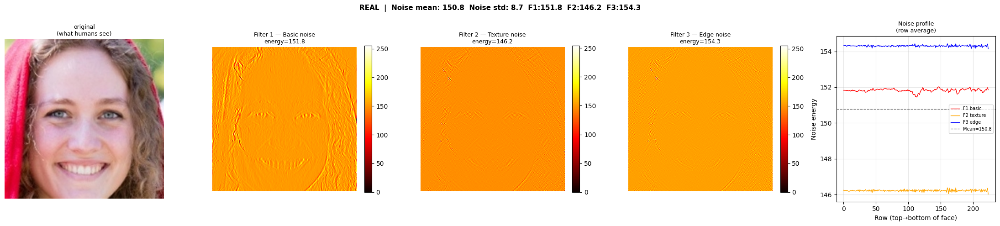

──────────────────────────────────────────────────
  Noise mean  : 150.78
  Noise std   : 8.65  ← higher = more irregular noise
  Filter 1    : 151.82  (basic pixel residual)
  Filter 2    : 146.22  (texture pattern)
  Filter 3    : 154.31  (edge artifact)
  → LOW std: uniform noise — typical natural face
──────────────────────────────────────────────────


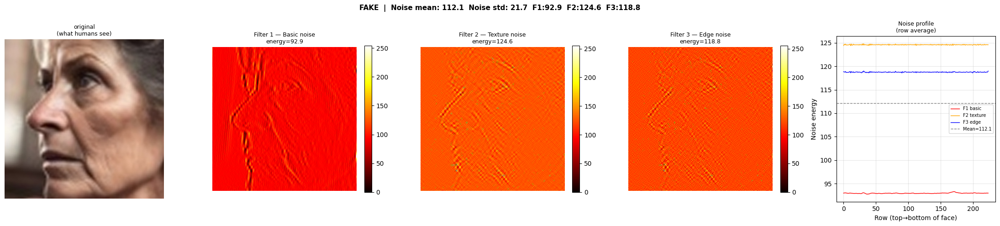

──────────────────────────────────────────────────
  Noise mean  : 112.10
  Noise std   : 21.66  ← higher = more irregular noise
  Filter 1    : 92.94  (basic pixel residual)
  Filter 2    : 124.60  (texture pattern)
  Filter 3    : 118.76  (edge artifact)
  → LOW std: uniform noise — typical natural face
──────────────────────────────────────────────────


In [7]:
import os, cv2, random, numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image

ALIGNED_BASE = '/kaggle/working/aligned_faces'
SRM_BASE     = '/kaggle/working/srm_noise'

def explain_srm_map(label='fake'):
    rgb_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{ALIGNED_BASE}/{label}')
                 if f.lower().endswith(('.jpg','.jpeg','.png'))}
    srm_files = {os.path.splitext(f)[0]: f
                 for f in os.listdir(f'{SRM_BASE}/{label}')
                 if f.lower().endswith('.png')}
    common = list(set(rgb_files.keys()) & set(srm_files.keys()))
    base   = random.choice(common)
    rgb     = np.array(Image.open(
                f'{ALIGNED_BASE}/{label}/{rgb_files[base]}').convert('RGB'))
    srm_bgr = cv2.imread(f'{SRM_BASE}/{label}/{srm_files[base]}')
    srm_rgb = cv2.cvtColor(srm_bgr, cv2.COLOR_BGR2RGB)
    ch1 = srm_rgb[:,:,0]
    ch2 = srm_rgb[:,:,1]
    ch3 = srm_rgb[:,:,2]
    noise_mean = srm_rgb.mean()
    noise_std  = srm_rgb.std()
    ch1_energy = ch1.mean()
    ch2_energy = ch2.mean()
    ch3_energy = ch3.mean()
    fig, axes = plt.subplots(1, 5, figsize=(22, 5))
    fig.suptitle(
        f'{label.upper()}  |  '
        f'Noise mean: {noise_mean:.1f}  '
        f'Noise std: {noise_std:.1f}  '
        f'F1:{ch1_energy:.1f}  F2:{ch2_energy:.1f}  F3:{ch3_energy:.1f}',
        fontsize=11, fontweight='bold')
    axes[0].imshow(rgb)
    axes[0].set_title('original\n(what humans see)', fontsize=9)
    axes[0].axis('off')
    im1 = axes[1].imshow(ch1, cmap='hot')
    axes[1].set_title(f'Filter 1 — Basic noise\nenergy={ch1_energy:.1f}', fontsize=9)
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046)
    im2 = axes[2].imshow(ch2, cmap='hot')
    axes[2].set_title(f'Filter 2 — Texture noise\nenergy={ch2_energy:.1f}', fontsize=9)
    axes[2].axis('off')
    plt.colorbar(im2, ax=axes[2], fraction=0.046)
    im3 = axes[3].imshow(ch3, cmap='hot')
    axes[3].set_title(f'Filter 3 — Edge noise\nenergy={ch3_energy:.1f}', fontsize=9)
    axes[3].axis('off')
    plt.colorbar(im3, ax=axes[3], fraction=0.046)
    profile_ch1 = ch1.mean(axis=1)
    profile_ch2 = ch2.mean(axis=1)
    profile_ch3 = ch3.mean(axis=1)
    axes[4].plot(profile_ch1, color='red',   linewidth=1, label='F1 basic')
    axes[4].plot(profile_ch2, color='orange',linewidth=1, label='F2 texture')
    axes[4].plot(profile_ch3, color='blue',  linewidth=1, label='F3 edge')
    axes[4].axhline(noise_mean, color='gray', linestyle='--',
                    linewidth=1, label=f'Mean={noise_mean:.1f}')
    axes[4].set_title('Noise profile\n(row average)', fontsize=9)
    axes[4].set_xlabel('Row (top→bottom of face)')
    axes[4].set_ylabel('Noise energy')
    axes[4].legend(fontsize=7)
    axes[4].grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f'{"─"*50}')
    print(f'  Noise mean  : {noise_mean:.2f}')
    print(f'  Noise std   : {noise_std:.2f}  ← higher = more irregular noise')
    print(f'  Filter 1    : {ch1_energy:.2f}  (basic pixel residual)')
    print(f'  Filter 2    : {ch2_energy:.2f}  (texture pattern)')
    print(f'  Filter 3    : {ch3_energy:.2f}  (edge artifact)')
    if noise_std > 45:
        print(f'  → HIGH std: irregular noise — possible manipulation')
    else:
        print(f'  → LOW std: uniform noise — typical natural face')
    print(f'{"─"*50}')

explain_srm_map('real')
explain_srm_map('fake')

In [ ]:
import os, cv2, numpy as np
from tqdm import tqdm
from sklearn.utils import shuffle

RGB_BASE = '/kaggle/working/aligned_faces'   
DCT_BASE = '/kaggle/working/dct_features'
SRM_BASE = '/kaggle/working/srm_noise'
SAVE_DIR = '/kaggle/working/final_arrays'
os.makedirs(SAVE_DIR, exist_ok=True)

def load_master_dataset():
    X_rgb, X_dct, X_srm, y = [], [], [], []

    for label, cat in enumerate(['real', 'fake']):
        print(f'\nLoading {cat.upper()}...')

        rgb_files = {os.path.splitext(f)[0]: f
                     for f in os.listdir(f'{RGB_BASE}/{cat}')
                     if f.lower().endswith(('.jpg','.jpeg','.png'))}
        dct_files = {os.path.splitext(f)[0]: f
                     for f in os.listdir(f'{DCT_BASE}/{cat}')
                     if f.endswith('.png')}
        srm_files = {os.path.splitext(f)[0]: f
                     for f in os.listdir(f'{SRM_BASE}/{cat}')
                     if f.endswith('.png')}

        common = list(set(rgb_files.keys()) &
                      set(dct_files.keys()) &
                      set(srm_files.keys()))
        print(f'  Matched triplets: {len(common)}')

        for base in tqdm(common, desc=cat):
            rgb = cv2.imread(f'{RGB_BASE}/{cat}/{rgb_files[base]}')
            dct = cv2.imread(f'{DCT_BASE}/{cat}/{dct_files[base]}', 0)
            srm = cv2.imread(f'{SRM_BASE}/{cat}/{srm_files[base]}')

            if rgb is None or dct is None or srm is None:
                continue

            rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
            srm = cv2.cvtColor(srm, cv2.COLOR_BGR2RGB)
            dct = np.expand_dims(dct, axis=-1)

            X_rgb.append(rgb)
            X_dct.append(dct)
            X_srm.append(srm)
            y.append(label)

    X_rgb = np.array(X_rgb, dtype=np.uint8)
    X_dct = np.array(X_dct, dtype=np.uint8)
    X_srm = np.array(X_srm, dtype=np.uint8)
    y     = np.array(y,     dtype=np.uint8)

    print('\nShuffling...')
    X_rgb, X_dct, X_srm, y = shuffle(
        X_rgb, X_dct, X_srm, y, random_state=42)

    print('Saving...')
    np.save(f'{SAVE_DIR}/X_rgb.npy', X_rgb)
    np.save(f'{SAVE_DIR}/X_dct.npy', X_dct)
    np.save(f'{SAVE_DIR}/X_srm.npy', X_srm)
    np.save(f'{SAVE_DIR}/y.npy',     y)

    return X_rgb, X_dct, X_srm, y

X_rgb, X_dct, X_srm, y = load_master_dataset()

print(f'\n{"="*40}')
print(f'RGB : {X_rgb.shape}')
print(f'DCT : {X_dct.shape}')
print(f'SRM : {X_srm.shape}')
print(f'y   : {y.shape}      real=0  fake=1')
ram = (X_rgb.nbytes + X_dct.nbytes + X_srm.nbytes) / 1e9
print(f'RAM : ~{ram:.2f} GB')
print(f'{"="*40}')


Loading REAL...
  Matched triplets: 9501


real: 100%|██████████| 9501/9501 [00:14<00:00, 667.63it/s]



Loading FAKE...
  Matched triplets: 9474


fake: 100%|██████████| 9474/9474 [00:14<00:00, 673.18it/s]



Shuffling...
Saving...

RGB : (18975, 224, 224, 3)
DCT : (18975, 224, 224, 1)
SRM : (18975, 224, 224, 3)
y   : (18975,)      real=0  fake=1
RAM : ~6.66 GB


In [9]:
del X_rgb, X_dct, X_srm, y
import gc; gc.collect()
print('RAM freed')

RAM freed


In [10]:
import numpy as np, gc, os
from sklearn.model_selection import train_test_split
from pathlib import Path

SAVE_DIR = Path('/kaggle/working/final_arrays')
SAVE_DIR.mkdir(parents=True, exist_ok=True)

print('Loading uint8 arrays...')
X_rgb = np.load(f'{SAVE_DIR}/X_rgb.npy')
X_dct = np.load(f'{SAVE_DIR}/X_dct.npy')
X_srm = np.load(f'{SAVE_DIR}/X_srm.npy')
y     = np.load(f'{SAVE_DIR}/y.npy')

print('Splitting...')
(X_train_rgb, X_test_rgb,
 X_train_dct, X_test_dct,
 X_train_srm, X_test_srm,
 y_train,     y_test) = train_test_split(
    X_rgb, X_dct, X_srm, y,
    test_size=0.2, random_state=42, stratify=y)

del X_rgb, X_dct, X_srm, y
gc.collect()

print('Saving uint8 splits to disk...')

def save_and_clear(name, data):
    np.save(SAVE_DIR / f"{name}_u8.npy", data)
    print(f"✅ Saved {name}_u8.npy")

save_and_clear("X_train_rgb", X_train_rgb); del X_train_rgb
save_and_clear("X_test_rgb",  X_test_rgb);  del X_test_rgb
save_and_clear("X_train_dct", X_train_dct); del X_train_dct
save_and_clear("X_test_dct",  X_test_dct);  del X_test_dct
save_and_clear("X_train_srm", X_train_srm); del X_train_srm
save_and_clear("X_test_srm",  X_test_srm);  del X_test_srm

np.save(SAVE_DIR / 'y_train.npy', y_train)
np.save(SAVE_DIR / 'y_test.npy',  y_test)
gc.collect()

print(f'\n{"="*40}')
print(f'Train samples: {len(y_train):,}')
print(f'Test samples:  {len(y_test):,}')
print(f'{"="*40}')

Loading uint8 arrays...
Splitting...
Saving uint8 splits to disk...
✅ Saved X_train_rgb_u8.npy
✅ Saved X_test_rgb_u8.npy
✅ Saved X_train_dct_u8.npy
✅ Saved X_test_dct_u8.npy
✅ Saved X_train_srm_u8.npy
✅ Saved X_test_srm_u8.npy

Train samples: 15,180
Test samples:  3,795


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import Sequence

SAVE_DIR   = '/kaggle/working/final_arrays'
BATCH_SIZE = 32  
class ForensicGenerator(Sequence):
    def __init__(self, rgb_path, dct_path, srm_path,
                 labels_path, batch_size=32, shuffle=True, augment=False):
        self.rgb        = np.load(rgb_path,    mmap_mode='r')
        self.dct        = np.load(dct_path,    mmap_mode='r')
        self.srm        = np.load(srm_path,    mmap_mode='r')
        self.labels     = np.load(labels_path)
        self.batch_size = batch_size
        self.shuffle    = shuffle
        self.augment    = augment   
        self.indices    = np.arange(len(self.labels))
        if shuffle:
            np.random.shuffle(self.indices)
        self._fixed_indices = self.indices.copy()

    def __len__(self):
        return len(self.labels) // self.batch_size

    def __getitem__(self, idx):
        inds = self.indices[
            idx * self.batch_size:(idx + 1) * self.batch_size]

        rgb = np.array(self.rgb[inds]).astype('float32') / 255.0
        dct = np.array(self.dct[inds]).astype('float32') / 255.0
        srm = np.array(self.srm[inds]).astype('float32') / 255.0
        y   = np.array(self.labels[inds]).astype('float32')

        
        if self.augment:
            for i in range(len(rgb)):
                if np.random.rand() > 0.5:          # random horizontal flip
                    rgb[i] = rgb[i, :, ::-1, :]
                    srm[i] = srm[i, :, ::-1, :]
                    dct[i] = dct[i, :, ::-1, :]
                factor = np.random.uniform(0.85, 1.15)   # brightness jitter
                rgb[i] = np.clip(rgb[i] * factor, 0, 1)

        return {'rgb_input': rgb, 'srm_input': srm, 'dct_input': dct}, y

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)
        else:
            self.indices = self._fixed_indices.copy()


train_gen = ForensicGenerator(
    f'{SAVE_DIR}/X_train_rgb_u8.npy',
    f'{SAVE_DIR}/X_train_dct_u8.npy',
    f'{SAVE_DIR}/X_train_srm_u8.npy',
    f'{SAVE_DIR}/y_train.npy',
    batch_size=BATCH_SIZE, shuffle=True, augment=True)

test_gen = ForensicGenerator(
    f'{SAVE_DIR}/X_test_rgb_u8.npy',
    f'{SAVE_DIR}/X_test_dct_u8.npy',
    f'{SAVE_DIR}/X_test_srm_u8.npy',
    f'{SAVE_DIR}/y_test.npy',
    batch_size=BATCH_SIZE, shuffle=False, augment=False)

print(f'Train batches: {len(train_gen)}')
print(f'Test  batches: {len(test_gen)}')
sample_x, sample_y = train_gen[0]
print(f'rgb_input : {sample_x["rgb_input"].shape}  expected (32,224,224,3)')
print(f'srm_input : {sample_x["srm_input"].shape}  expected (32,224,224,3)')
print(f'dct_input : {sample_x["dct_input"].shape}  expected (32,224,224,1)')
print(f'labels    : {sample_y.shape}')
print('Generator ready!')

Train batches: 474
Test  batches: 118
rgb_input : (32, 224, 224, 3)  expected (32,224,224,3)
srm_input : (32, 224, 224, 3)  expected (32,224,224,3)
dct_input : (32, 224, 224, 1)  expected (32,224,224,1)
labels    : (32,)
Generator ready!


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers

def build_model():
   
    input_rgb = layers.Input(shape=(224, 224, 3), name='rgb_input')
    base_rgb  = tf.keras.applications.EfficientNetB3(
        include_top=False, weights='imagenet', input_tensor=input_rgb)
    base_rgb.trainable = False
    x_rgb = layers.GlobalAveragePooling2D()(base_rgb.output)
    x_rgb = layers.Dense(256, activation='relu',
                         kernel_regularizer=regularizers.l2(1e-4))(x_rgb)
    x_rgb = layers.Dense(128, activation='relu')(x_rgb)
    x_rgb = layers.Dropout(0.4)(x_rgb)

    
    input_srm = layers.Input(shape=(224, 224, 3), name='srm_input')
    x_srm = layers.Conv2D(32, 3, activation='relu', padding='same')(input_srm)
    x_srm = layers.BatchNormalization()(x_srm)
    x_srm = layers.MaxPooling2D(2)(x_srm)
    x_srm = layers.Conv2D(64, 3, activation='relu', padding='same')(x_srm)
    x_srm = layers.BatchNormalization()(x_srm)
    x_srm = layers.MaxPooling2D(2)(x_srm)
    x_srm = layers.Conv2D(128, 3, activation='relu', padding='same')(x_srm)
    x_srm = layers.BatchNormalization()(x_srm)
    x_srm = layers.MaxPooling2D(2)(x_srm)
    x_srm = layers.Conv2D(256, 3, activation='relu', padding='same')(x_srm)
    x_srm = layers.BatchNormalization()(x_srm)
    x_srm = layers.GlobalAveragePooling2D()(x_srm)
    x_srm = layers.Dense(128, activation='relu',
                         kernel_regularizer=regularizers.l2(1e-4))(x_srm)
    x_srm = layers.Dropout(0.4)(x_srm)

    
    input_dct = layers.Input(shape=(224, 224, 1), name='dct_input')
    x_dct = layers.Conv2D(32, 3, activation='relu', padding='same')(input_dct)
    x_dct = layers.BatchNormalization()(x_dct)
    x_dct = layers.MaxPooling2D(2)(x_dct)
    x_dct = layers.Conv2D(64, 3, activation='relu', padding='same')(x_dct)
    x_dct = layers.BatchNormalization()(x_dct)
    x_dct = layers.MaxPooling2D(2)(x_dct)
    x_dct = layers.Conv2D(128, 3, activation='relu', padding='same')(x_dct)
    x_dct = layers.BatchNormalization()(x_dct)
    x_dct = layers.GlobalAveragePooling2D()(x_dct)
    x_dct = layers.Dense(128, activation='relu',
                         kernel_regularizer=regularizers.l2(1e-4))(x_dct)
    x_dct = layers.Dropout(0.3)(x_dct)

    
    merged = layers.Concatenate()([x_rgb, x_srm, x_dct])
    x      = layers.Dense(512, activation='relu',
                          kernel_regularizer=regularizers.l2(1e-4))(merged)
    x      = layers.Dropout(0.5)(x)
    x      = layers.Dense(256, activation='relu',
                          kernel_regularizer=regularizers.l2(1e-4))(x)
    x      = layers.Dropout(0.4)(x)
    x      = layers.Dense(64,  activation='relu')(x)
    output = layers.Dense(1,   activation='sigmoid', name='output')(x)

    return models.Model(
        inputs=[input_rgb, input_srm, input_dct],
        outputs=output)

def compile_phase2(model):
    efficientnet_layers = [
        layer for layer in model.layers
        if any(x in layer.name for x in
               ['block', 'stem', 'top_conv', 'top_bn', 'top_activation'])
    ]
    print(f'EfficientNet layers found: {len(efficientnet_layers)}')
    for layer in efficientnet_layers:
        layer.trainable = False
    for layer in efficientnet_layers[-30:]:   # improvement #9: was 20
        layer.trainable = True
    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-5),
        loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),  # #10
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])
    trainable = sum([tf.size(w).numpy()
                     for w in model.trainable_weights])
    print(f'Trainable params Phase 2: {trainable:,}')
    return model

forensic_brain = build_model()
forensic_brain.compile(
    optimizer=tf.keras.optimizers.Adam(3e-4),   # improvement #4: was 1e-3
    loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),  # #10
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

total     = forensic_brain.count_params()
trainable = sum([tf.size(w).numpy()
                 for w in forensic_brain.trainable_weights])
print(f'Total     : {total:,}')
print(f'Trainable : {trainable:,}  (Phase 1 head only)')
print(f'Frozen    : {total-trainable:,}')

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Total     : 12,088,176
Trainable : 1,303,233  (Phase 1 head only)
Frozen    : 10,784,943


In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import (EarlyStopping,
                                        ModelCheckpoint,
                                        ReduceLROnPlateau)

class ResetValGenerator(tf.keras.callbacks.Callback):
    def __init__(self, generator):
        super().__init__()
        self.generator = generator
    def on_epoch_begin(self, epoch, logs=None):
        self.generator.indices = self.generator._fixed_indices.copy()

def evaluate_on_test(model, test_gen, phase_name):
    test_gen.indices = test_gen._fixed_indices.copy()
    print(f'\nEvaluating {phase_name} on full test set...')
    results = model.evaluate(test_gen, steps=len(test_gen), verbose=1)
    print(f'{phase_name} — Test Loss    : {results[0]:.4f}')
    print(f'{phase_name} — Test Accuracy: {results[1]:.4f}  ({results[1]*100:.1f}%)')
    print(f'{phase_name} — Test AUC     : {results[2]:.4f}  ({results[2]*100:.1f}%)')
    return results


y_train_labels = np.load('/kaggle/working/final_arrays/y_train.npy')
classes        = np.unique(y_train_labels)
weights        = compute_class_weight('balanced',
                                      classes=classes,
                                      y=y_train_labels)
class_weight   = {0: weights[0], 1: weights[1]}
print(f'Class weights — real: {weights[0]:.4f}  fake: {weights[1]:.4f}')
# If both are ~1.0 your dataset is balanced — weights do nothing harmful


cb_p1 = [
    ResetValGenerator(test_gen),
    EarlyStopping(monitor='val_auc', mode='max',
                  patience=7,
                  restore_best_weights=True, verbose=1),
    ModelCheckpoint('/kaggle/working/model_phase1.keras',
                    monitor='val_auc', mode='max',
                    save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3,
                      patience=4,
                      min_lr=1e-7, verbose=1)
]


print('PHASE 1 — head only, backbone frozen...')
history1 = forensic_brain.fit(
    train_gen,
    validation_data=test_gen,
    epochs=40,
    validation_steps=len(test_gen),
    callbacks=cb_p1,
    class_weight=class_weight,   # ADDED: zero risk
    verbose=1)

p1_auc = max(history1.history['val_auc'])
p1_acc = max(history1.history['val_accuracy'])
print(f'\nPhase 1 best val_auc : {p1_auc:.4f}')
print(f'Phase 1 best val_acc : {p1_acc:.4f}')
p1_results = evaluate_on_test(forensic_brain, test_gen, 'Phase 1')


if p1_auc >= 0.60:
    print('\nPhase 1 OK — starting Phase 2...')
    forensic_brain = compile_phase2(forensic_brain)

    cb_p2 = [
        ResetValGenerator(test_gen),
        EarlyStopping(monitor='val_auc', mode='max',
                      patience=7,
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint('/kaggle/working/model_phase2.keras',
                        monitor='val_auc', mode='max',
                        save_best_only=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.3,
                          patience=4,
                          min_lr=1e-7, verbose=1)
    ]

    print('PHASE 2 — fine-tuning top 30 EfficientNet layers...')
    history2 = forensic_brain.fit(
        train_gen,
        validation_data=test_gen,
        epochs=30,
        validation_steps=len(test_gen),
        callbacks=cb_p2,
        class_weight=class_weight,   # ADDED: zero risk
        verbose=1)

    p2_auc = max(history2.history['val_auc'])
    p2_acc = max(history2.history['val_accuracy'])
    p2_results = evaluate_on_test(forensic_brain, test_gen, 'Phase 2')

    print(f'\n{"="*45}')
    print(f'           Phase 1    Phase 2')
    print(f'val AUC  : {p1_auc:.4f}    {p2_auc:.4f}')
    print(f'val Acc  : {p1_acc:.4f}    {p2_acc:.4f}')
    print(f'Test AUC : {p1_results[2]:.4f}    {p2_results[2]:.4f}')
    print(f'Test Acc : {p1_results[1]:.4f}    {p2_results[1]:.4f}')
    print(f'AUC gain : {p2_auc - p1_auc:+.4f}')
    print(f'{"="*45}')
else:
    print(f'WARNING: AUC {p1_auc:.4f} too low — check data')


print('\nLoading best saved model...')
try:
    forensic_brain = tf.keras.models.load_model(
        '/kaggle/working/model_phase2.keras')
    print('✅ Loaded model_phase2.keras')
except:
    forensic_brain = tf.keras.models.load_model(
        '/kaggle/working/model_phase1.keras')
    print('✅ Loaded model_phase1.keras (Phase 2 not found)')

Class weights — real: 0.9986  fake: 1.0015
PHASE 1 — head only, backbone frozen...
Epoch 1/40


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1778005424.716412     320 service.cc:152] XLA service 0x548c5d60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778005424.716456     320 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1778005424.716460     320 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1778005429.444232     320 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-05-05 18:24:01.533809: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal acc

474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.4972 - auc: 0.5020 - loss: 0.8506
Epoch 1: val_auc improved from -inf to 0.49637, saving model to /kaggle/working/model_phase1.keras
474/474 ━━━━━━━━━━━━━━━━━━━━ 175s 241ms/step - accuracy: 0.4973 - auc: 0.5020 - loss: 0.8506 - val_accuracy: 0.4910 - val_auc: 0.4964 - val_loss: 0.8094 - learning_rate: 3.0000e-04
Epoch 2/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - accuracy: 0.5187 - auc: 0.5275 - loss: 0.8081
Epoch 2: val_auc improved from 0.49637 to 0.53958, saving model to /kaggle/working/model_phase1.keras
474/474 ━━━━━━━━━━━━━━━━━━━━ 102s 216ms/step - accuracy: 0.5187 - auc: 0.5275 - loss: 0.8080 - val_accuracy: 0.5119 - val_auc: 0.5396 - val_loss: 0.7952 - learning_rate: 3.0000e-04
Epoch 3/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - accuracy: 0.5373 - auc: 0.5565 - loss: 0.7904
Epoch 3: val_auc did not improve from 0.53958
474/474 ━━━━━━━━━━━━━━━━━━━━ 101s 213ms/step - accuracy: 0.5373 - auc: 0.5565 - loss: 0.7904 - v

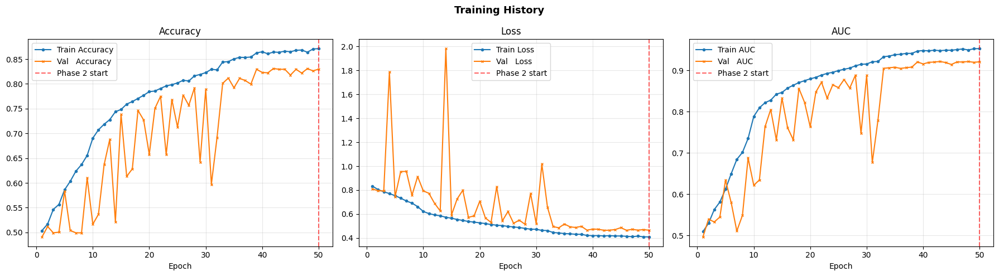

Plot: Phase 1 + Phase 2

Loading ensemble models...
✅ Loaded model_phase2.keras
✅ Loaded model_phase1.keras
Predicting with TTA + Ensemble on test set...
(This takes ~5x longer than normal — please wait)


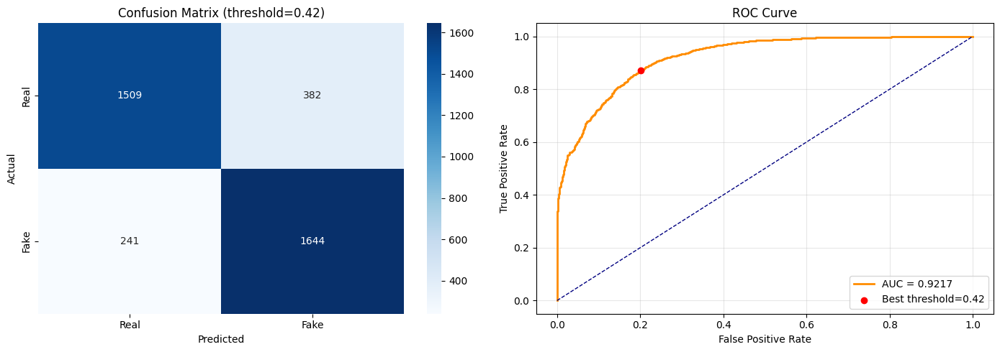


  True  Real (TN) : 1509  correctly identified real
  True  Fake (TP) : 1644  correctly caught fakes
  False Alarm (FP): 382  real called fake
  Missed Fake (FN): 241  fake slipped through
  AUC             : 0.9217  (92.2%)
  Best threshold  : 0.4191
  Accuracy at best threshold: 0.8350  (83.5%)

Classification Report:
              precision    recall  f1-score   support

        Real       0.86      0.80      0.83      1891
        Fake       0.81      0.87      0.84      1885

    accuracy                           0.84      3776
   macro avg       0.84      0.84      0.83      3776
weighted avg       0.84      0.84      0.83      3776


Final AUC      : 0.9217  (92.2%)
Best threshold : 0.4191


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import (confusion_matrix, classification_report,
                              roc_curve, auc)


def plot_history(h1, h2=None):
    acc      = h1.history['accuracy']
    val_acc  = h1.history['val_accuracy']
    loss     = h1.history['loss']
    val_loss = h1.history['val_loss']
    auc_     = h1.history['auc']
    val_auc  = h1.history['val_auc']
    if h2:
        acc      += h2.history['accuracy']
        val_acc  += h2.history['val_accuracy']
        loss     += h2.history['loss']
        val_loss += h2.history['val_loss']
        auc_     += h2.history['auc']
        val_auc  += h2.history['val_auc']
    epochs = range(1, len(acc) + 1)
    p1_end = len(h1.history['accuracy'])
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle('Training History', fontsize=13, fontweight='bold')
    for ax, tr, val, title in zip(
        axes,
        [acc,     loss,     auc_],
        [val_acc, val_loss, val_auc],
        ['Accuracy', 'Loss', 'AUC']
    ):
        ax.plot(epochs, tr,  label=f'Train {title}', marker='o', markersize=3)
        ax.plot(epochs, val, label=f'Val   {title}', marker='x', markersize=3)
        if h2:
            ax.axvline(p1_end, color='red', linestyle='--',
                       alpha=0.6, label='Phase 2 start')
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.legend()
        ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


def predict_with_tta(model, x_batch):
    preds = []
    # Original
    preds.append(model.predict(x_batch, verbose=0))
    # Horizontal flip
    x_flip = {k: v[:, :, ::-1, :] if v.ndim == 4 else v
               for k, v in x_batch.items()}
    preds.append(model.predict(x_flip, verbose=0))
    # Brightness variations
    for factor in [0.9, 1.1, 0.95]:
        x_bright = {k: np.clip(v * factor, 0, 1)
                    for k, v in x_batch.items()}
        preds.append(model.predict(x_bright, verbose=0))
    return np.mean(preds, axis=0)


def load_ensemble():
    models = []
    try:
        m2 = tf.keras.models.load_model('/kaggle/working/model_phase2.keras')
        models.append((m2, 0.6))   # Phase 2 gets 60% weight
        print('✅ Loaded model_phase2.keras')
    except:
        print('⚠️ model_phase2.keras not found')
    try:
        m1 = tf.keras.models.load_model('/kaggle/working/model_phase1.keras')
        models.append((m1, 0.4))   # Phase 1 gets 40% weight
        print('✅ Loaded model_phase1.keras')
    except:
        print('⚠️ model_phase1.keras not found')
    return models


def evaluate_model(model, test_gen):
    print('\nLoading ensemble models...')
    ensemble = load_ensemble()

    print('Predicting with TTA + Ensemble on test set...')
    print('(This takes ~5x longer than normal — please wait)')
    y_true, y_probs = [], []

    test_gen.indices = np.arange(len(test_gen.labels))

    for i in range(len(test_gen)):
        x_batch, y_batch = test_gen[i]

        if len(ensemble) > 1:
            # Weighted ensemble of both models, each with TTA
            batch_pred = np.zeros((len(y_batch), 1))
            total_weight = sum(w for _, w in ensemble)
            for m, w in ensemble:
                batch_pred += (w / total_weight) * predict_with_tta(m, x_batch)
        else:
            # Single model with TTA
            batch_pred = predict_with_tta(model, x_batch)

        y_true.extend(y_batch)
        y_probs.extend(batch_pred.flatten())

    y_true  = np.array(y_true)
    y_probs = np.array(y_probs)

    # Best threshold from ROC
    fpr, tpr, thresholds = roc_curve(y_true, y_probs)
    roc_auc = auc(fpr, tpr)
    opt_idx = np.argmax(tpr - fpr)
    opt_thr = thresholds[opt_idx]
    y_pred  = (y_probs > opt_thr).astype(int)

    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Real', 'Fake'],
                yticklabels=['Real', 'Fake'], ax=axes[0])
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')
    axes[0].set_title(f'Confusion Matrix (threshold={opt_thr:.2f})')
    axes[1].plot(fpr, tpr, color='darkorange', lw=2,
                 label=f'AUC = {roc_auc:.4f}')
    axes[1].scatter(fpr[opt_idx], tpr[opt_idx], color='red',
                    zorder=5, label=f'Best threshold={opt_thr:.2f}')
    axes[1].plot([0, 1], [0, 1], 'navy', linestyle='--', lw=1)
    axes[1].set_xlabel('False Positive Rate')
    axes[1].set_ylabel('True Positive Rate')
    axes[1].set_title('ROC Curve')
    axes[1].legend()
    axes[1].grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f'\n{"="*45}')
    print(f'  True  Real (TN) : {tn}  correctly identified real')
    print(f'  True  Fake (TP) : {tp}  correctly caught fakes')
    print(f'  False Alarm (FP): {fp}  real called fake')
    print(f'  Missed Fake (FN): {fn}  fake slipped through')
    print(f'  AUC             : {roc_auc:.4f}  ({roc_auc*100:.1f}%)')
    print(f'  Best threshold  : {opt_thr:.4f}')
    print(f'{"="*45}')
    correct = tn + tp
    total   = tn + tp + fp + fn
    print(f'  Accuracy at best threshold: {correct/total:.4f}  ({correct/total*100:.1f}%)')
    print(f'{"="*45}')
    print('\nClassification Report:')
    print(classification_report(y_true, y_pred,
                                target_names=['Real', 'Fake']))
    return roc_auc, opt_thr


try:
    plot_history(history1, history2)
    print('Plot: Phase 1 + Phase 2')
except NameError:
    plot_history(history1)
    print('Plot: Phase 1 only')

roc_auc, best_threshold = evaluate_model(forensic_brain, test_gen)
print(f'\nFinal AUC      : {roc_auc:.4f}  ({roc_auc*100:.1f}%)')
print(f'Best threshold : {best_threshold:.4f}')

In [3]:
import tensorflow as tf

def check_model_identity(file_path):
    model = tf.keras.models.load_model(file_path)
    # Count how many parameters the model is allowed to change
    trainable_count = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    return trainable_count

p1_count = check_model_identity('model_phase1.keras')
p2_count = check_model_identity('model_phase2.keras')

print(f"Phase 1 Trainable Parameters: {p1_count:,}")
print(f"Phase 2 Trainable Parameters: {p2_count:,}")

if p2_count > p1_count:
    print("\n✅ VERIFIED: Phase 2 is definitely the advanced, fine-tuned model.")
else:
    print("\n⚠️ WARNING: Something is wrong, Phase 2 should be the advanced one.")

Phase 1 Trainable Parameters: 1,303,233
Phase 2 Trainable Parameters: 4,857,403

✅ VERIFIED: Phase 2 is definitely the advanced, fine-tuned model.
